# User Experience Analysis

### Import Packages

In [148]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os

sys.path.append(os.path.abspath(os.path.join("../script")))
from ploting_utils import PlotingUtils
from get_dataframe_information import DataFrameInformation
from get_missing_information import MissingInformation
from data_clean_handler import CleanData

In [149]:
import logging
logging.basicConfig(filename='../logfile.log', filemode='a',
                    encoding='utf-8', level=logging.DEBUG)


### Read data from csv

In [150]:
try:
    df = pd.read_csv('../data/Week1_challenge_data_source.csv')
except BaseException:
    logging.error('file not found or wrong format')


In [151]:
to_string = ['MSISDN/Number','Handset Type']

for col in to_string:
    df[col] = df[col].astype('category')

In [152]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',


## Task 3

To conduct user experience analysis we work with parameters like TCP retransmission, round trip time(RTT), throughtput, device type.


***Columns to be Used***
- Average TCP retransmission
    - 'TCP DL Retrans. Vol (Bytes)' 
    - 'TCP UL Retrans. Vol (Bytes)'
- Average RTT
    - 'Avg RTT DL (ms)'
    - 'Avg RTT UL (ms)'
- Handset Type
    - 'Handset Type'
- Average Throughput
    - 'Avg Bearer TP UL (kbps)'
    - 'Avg Bearer TP DL (kbps)'


In [153]:
selected_columns = [
    'MSISDN/Number',
    'TCP DL Retrans. Vol (Bytes)',
    'TCP UL Retrans. Vol (Bytes)',
    'Avg RTT DL (ms)', 'Avg RTT UL (ms)',
    'Avg Bearer TP UL (kbps)', 'Avg Bearer TP DL (kbps)',
    'Handset Type']


In [154]:
selected_df = df[selected_columns]
selected_df

,MSISDN/Number,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps),Handset Type
0,3.366496e+10,NaN,NaN,42.0,5.0,44.0,23.0,Samsung Galaxy A5 Sm-A520F
1,3.368185e+10,NaN,NaN,65.0,5.0,26.0,16.0,Samsung Galaxy J5 (Sm-J530)
2,3.376063e+10,NaN,NaN,NaN,NaN,9.0,6.0,Samsung Galaxy A8 (2018)
3,3.375034e+10,NaN,NaN,NaN,NaN,44.0,44.0,undefined
4,3.369980e+10,NaN,NaN,NaN,NaN,9.0,6.0,Samsung Sm-G390F
...,...,...,...,...,...,...,...,...
149996,3.365069e+10,NaN,NaN,32.0,0.0,65.0,52.0,Apple iPhone 8 Plus (A1897)
149997,3.366345e+10,NaN,NaN,27.0,2.0,54.0,23.0,Apple iPhone Se (A1723)
149998,3.362189e+10,NaN,NaN,43.0,6.0,47.0,43.0,Apple iPhone Xs (A2097)
149999,3.361962e+10,NaN,NaN,37.0,5.0,37.0,34.0,Huawei Fig-Lx1


### Task 3.1
- handle missing value
- handle outliers

In [155]:
dinfo = DataFrameInformation(selected_df)
dinfo.get_skewness_missing_count(selected_df)


/Users/user/TENAC/week-1-4/Week-1/User-Analytics-Telecommunication-Industry/script/get_dataframe_information.py:22: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,skewness,Missing Values,% of Total Values,Dtype
TCP UL Retrans. Vol (Bytes),84.113393,96649,64.4,float64
TCP DL Retrans. Vol (Bytes),15.951809,88146,58.8,float64
Avg RTT DL (ms),62.907828,27829,18.6,float64
Avg RTT UL (ms),28.457415,27812,18.5,float64
MSISDN/Number,NaN,1066,0.7,category
Handset Type,NaN,572,0.4,category
Avg Bearer TP UL (kbps),4.503413,1,0.0,float64
Avg Bearer TP DL (kbps),2.589437,1,0.0,float64


#### fill the missing with mode

In [156]:
cleaner = CleanData(selected_df)
#replace the missing wiht mode

selected_df = cleaner.fill_mode(selected_df.copy(),selected_columns[1:])

# drop the rows with null after mode fillinåg
selected_df = selected_df.dropna(axis=0)
selected_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 148935 entries, 0 to 149999
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   MSISDN/Number                148935 non-null  category
 1   TCP DL Retrans. Vol (Bytes)  148935 non-null  float64 
 2   TCP UL Retrans. Vol (Bytes)  148935 non-null  float64 
 3   Avg RTT DL (ms)              148935 non-null  float64 
 4   Avg RTT UL (ms)              148935 non-null  float64 
 5   Avg Bearer TP UL (kbps)      148935 non-null  float64 
 6   Avg Bearer TP DL (kbps)      148935 non-null  float64 
 7   Handset Type                 148935 non-null  category
dtypes: category(2), float64(6)
memory usage: 13.7 MB


##### Handle outliers

In [157]:
selected_df.head()

,MSISDN/Number,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps),Handset Type
0,3.366496e+10,1330.0,1330.0,42.0,5.0,44.0,23.0,Samsung Galaxy A5 Sm-A520F
1,3.368185e+10,1330.0,1330.0,65.0,5.0,26.0,16.0,Samsung Galaxy J5 (Sm-J530)
2,3.376063e+10,1330.0,1330.0,28.0,5.0,9.0,6.0,Samsung Galaxy A8 (2018)
3,3.375034e+10,1330.0,1330.0,28.0,5.0,44.0,44.0,undefined
4,3.369980e+10,1330.0,1330.0,28.0,5.0,9.0,6.0,Samsung Sm-G390F


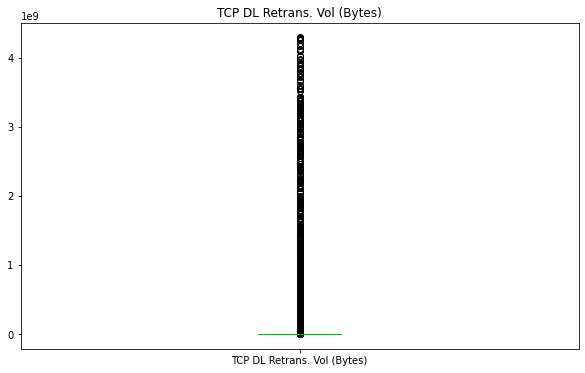

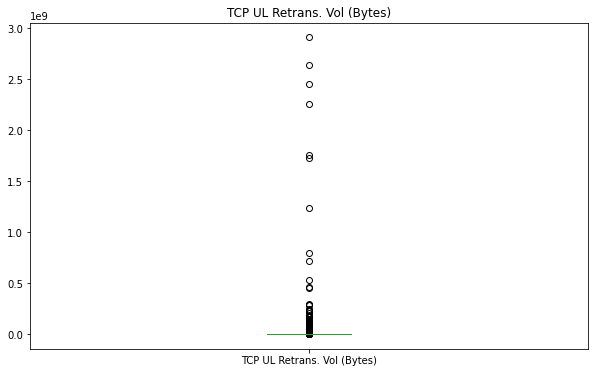

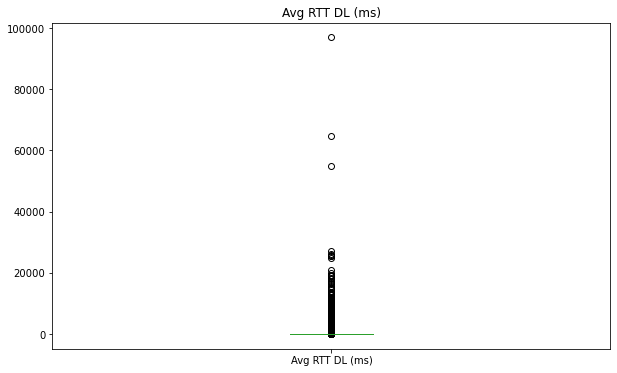

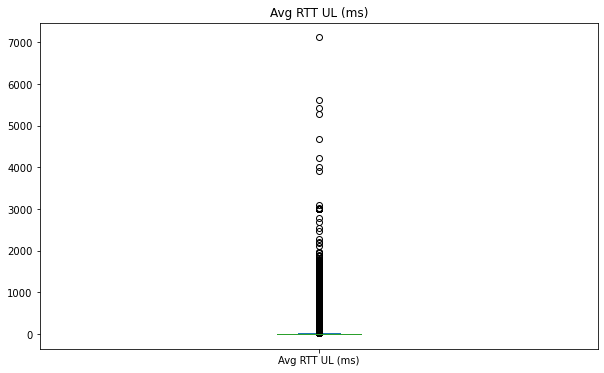

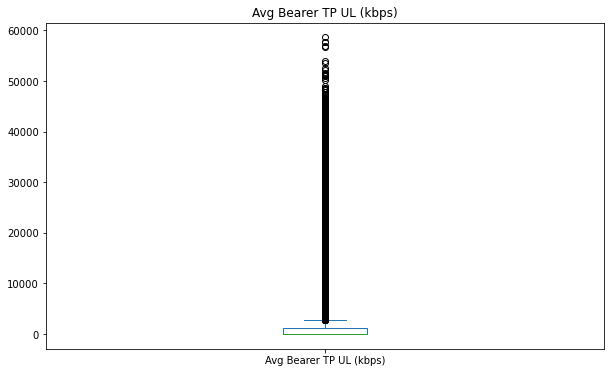

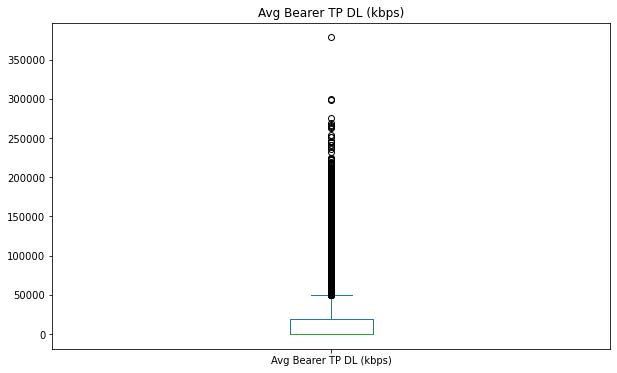

In [158]:
for col in selected_df.columns.tolist()[1:-1]:
    selected_df[col].plot(kind='box',title=col,figsize=(10,6))
    plt.show()

In [160]:
from scipy.stats.mstats import winsorize

selected_columns = selected_df.select_dtypes(include='float64').columns
for col in selected_columns:
    selected_df[col] = winsorize(selected_df[col],(0.25,0.25))


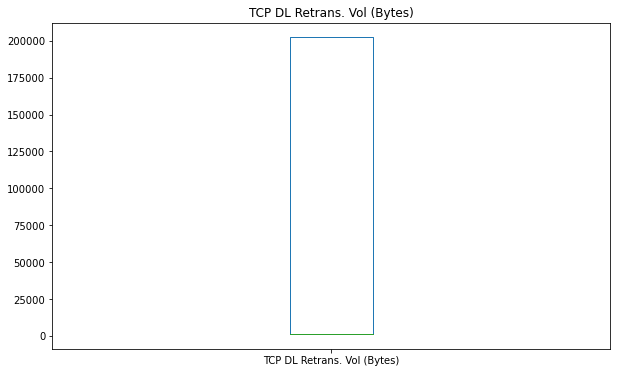

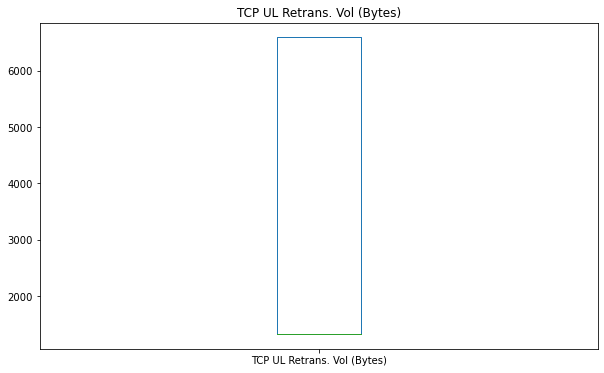

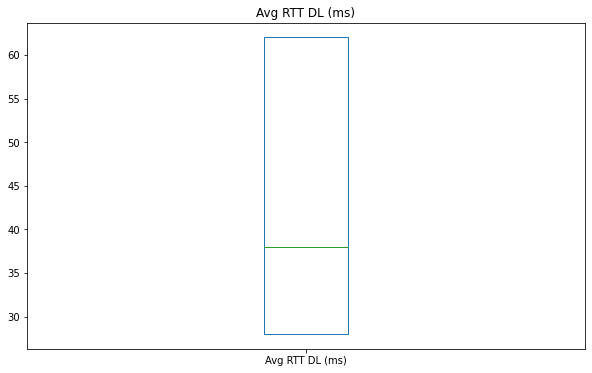

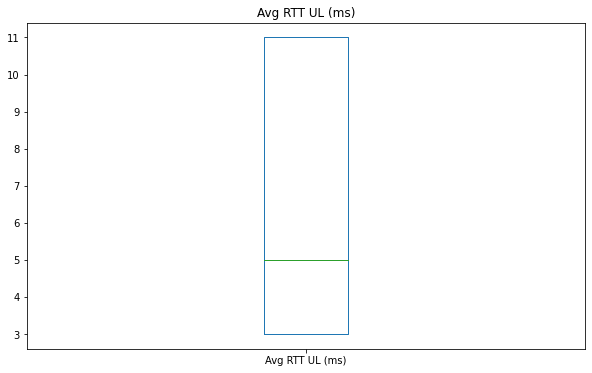

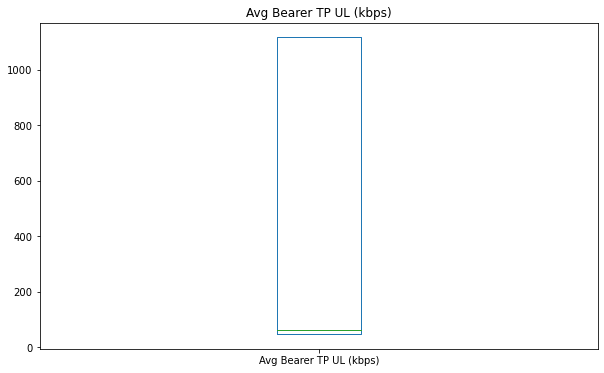

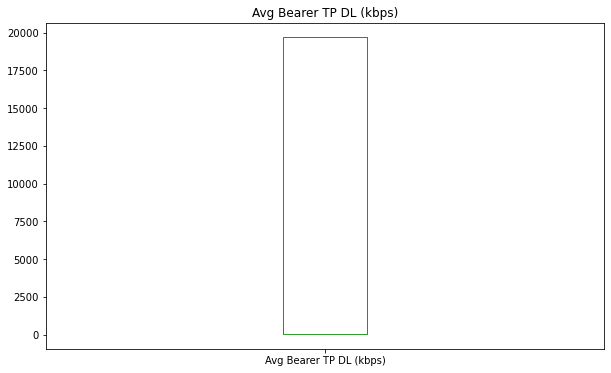

In [162]:
for col in selected_df.columns.tolist()[1:-1]:
    selected_df[col].plot(kind='box', title=col, figsize=(10, 6))
    plt.show()


In [163]:

for col in selected_df.columns.tolist()[1:-1]:
    q1 = selected_df[col].quantile(0.25)
    q3 = selected_df[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr
    




/Users/user/miniforge3/envs/10A/lib/python3.10/site-packages/numpy/lib/function_base.py:4691: UserWarning:




In [164]:
agg_df= selected_df.groupby(
    'MSISDN/Number').agg({col: 'sum' for col in selected_df.columns[1:-1]}).reset_index()

# agg_df['Handset Type'] = selected_df.groupby(
    # 'MSISDN/Number').agg({selected_df.columns[-1]:'count'}).reset_index()['Handset Type']
agg_df

,MSISDN/Number,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps)
0,3.360100e+10,1330.0,1330.0,46.0,3.0,47.0,43.0
1,3.360100e+10,1330.0,1330.0,30.0,3.0,51.0,48.0
2,3.360100e+10,1330.0,1330.0,28.0,5.0,49.0,48.0
3,3.360101e+10,1330.0,1330.0,62.0,11.0,47.0,204.0
4,3.360101e+10,203524.0,7920.0,90.0,8.0,1164.0,19724.0
...,...,...,...,...,...,...,...
106851,3.379000e+10,202194.0,3001.0,42.0,10.0,387.0,9978.0
106852,3.379000e+10,1330.0,1330.0,34.0,6.0,48.0,68.0
106853,3.197021e+12,1330.0,1330.0,28.0,5.0,47.0,43.0
106854,3.370000e+14,1330.0,1330.0,28.0,5.0,47.0,43.0


### Task 3.2

- 10 top, bottom
- 10 most frequent

In [165]:
paired_columns = [
    ['TCP DL Retrans. Vol (Bytes)',	'TCP UL Retrans. Vol (Bytes)'],	
    ['Avg RTT DL (ms)',	'Avg RTT UL (ms)'],
    ['Avg Bearer TP UL (kbps)',	'Avg Bearer TP DL (kbps)']]


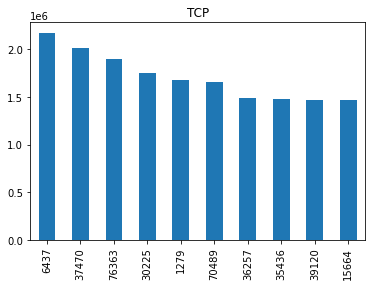

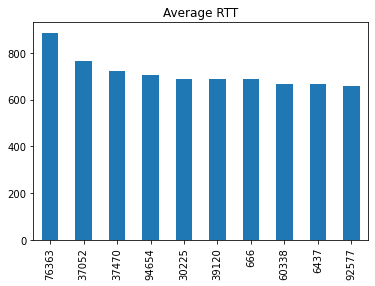

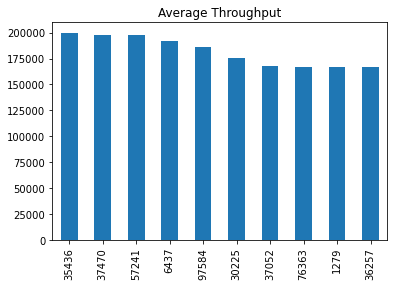

In [166]:
total_df = pd.DataFrame()

total_df['MSISDN/Number'] = agg_df['MSISDN/Number']

total_df[paired_columns[0][0].split(
    ' ')[0]] = agg_df[paired_columns[0][0]] + agg_df[paired_columns[0][1]]
total_df[paired_columns[1][0].split(
    ' ')[1]] = agg_df[paired_columns[1][0]] + agg_df[paired_columns[1][1]]
total_df[paired_columns[2][0].split(
    ' ')[1]] = agg_df[paired_columns[2][0]] + agg_df[paired_columns[2][1]]

total_df = total_df.rename(columns={'RTT':'Average RTT'})
total_df = total_df.rename(columns={'Bearer': 'Average Throughput'})

for col in total_df.columns[1:]:
    total_df.sort_values(col, ascending=False)[col][:10].plot(kind='bar', title=col)
    plt.show()
    


In [167]:
# agg_df.sort_values('Handset Type',ascending=False)['Handset Type'][:10].plot(kind='bar', title='Handset type count')
# plt.show()

### Task 3.3
- compute - report

In [168]:
selected_df


,MSISDN/Number,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps),Handset Type
0,3.366496e+10,1330.0,1330.0,42.0,5.0,47.0,43.0,Samsung Galaxy A5 Sm-A520F
1,3.368185e+10,1330.0,1330.0,62.0,5.0,47.0,43.0,Samsung Galaxy J5 (Sm-J530)
2,3.376063e+10,1330.0,1330.0,28.0,5.0,47.0,43.0,Samsung Galaxy A8 (2018)
3,3.375034e+10,1330.0,1330.0,28.0,5.0,47.0,44.0,undefined
4,3.369980e+10,1330.0,1330.0,28.0,5.0,47.0,43.0,Samsung Sm-G390F
...,...,...,...,...,...,...,...,...
149995,3.366865e+10,202194.0,6590.0,62.0,9.0,1117.0,19681.0,undefined
149996,3.365069e+10,1330.0,1330.0,32.0,3.0,65.0,52.0,Apple iPhone 8 Plus (A1897)
149997,3.366345e+10,1330.0,1330.0,28.0,3.0,54.0,43.0,Apple iPhone Se (A1723)
149998,3.362189e+10,1330.0,1330.0,43.0,6.0,47.0,43.0,Apple iPhone Xs (A2097)


In [169]:
agg_handset = selected_df.groupby('Handset Type').agg(
    {col: 'sum' for col in selected_df.columns[1:-1]}).reset_index()
agg_handset
# agg_handset.sort_values('TCP',ascending=False)[:10].plot(kind='bar',x='Handset Type',y='TCP',rot=90)


,Handset Type,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps)
0,A-Link Telecom I. Cubot A5,1330.0,1330.0,40.0,3.0,326.0,19681.0
1,A-Link Telecom I. Cubot Note Plus,202194.0,6590.0,62.0,8.0,172.0,6527.0
2,A-Link Telecom I. Cubot Note S,202194.0,6590.0,62.0,4.0,422.0,8515.0
3,A-Link Telecom I. Cubot Nova,135840.0,1330.0,40.0,4.0,550.0,19681.0
4,A-Link Telecom I. Cubot Power,7799.0,1330.0,39.0,4.0,342.0,19681.0
...,...,...,...,...,...,...,...
1391,Zte Zte Blade C2 Smartphone Android By Sfr Sta...,3990.0,2660.0,90.0,8.0,94.0,128.0
1392,Zyxel Communicat. Lte7460,202194.0,6590.0,62.0,11.0,1117.0,19681.0
1393,Zyxel Communicat. Sbg3600,202194.0,6590.0,62.0,11.0,1117.0,19681.0
1394,Zyxel Communicat. Zyxel Wah7706,1330.0,1330.0,33.0,8.0,910.0,1263.0


In [170]:
agg_handset['Average Throughput'] = agg_handset[agg_handset.columns[5]
                                                ] + agg_handset[agg_handset.columns[6]]

agg_handset['Average TCP Retrans'] = agg_handset[agg_handset.columns[1]
                                                 ] + agg_handset[agg_handset.columns[2]]

agg_handset.head()


,Handset Type,TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP UL (kbps),Avg Bearer TP DL (kbps),Average Throughput,Average TCP Retrans
0,A-Link Telecom I. Cubot A5,1330.0,1330.0,40.0,3.0,326.0,19681.0,20007.0,2660.0
1,A-Link Telecom I. Cubot Note Plus,202194.0,6590.0,62.0,8.0,172.0,6527.0,6699.0,208784.0
2,A-Link Telecom I. Cubot Note S,202194.0,6590.0,62.0,4.0,422.0,8515.0,8937.0,208784.0
3,A-Link Telecom I. Cubot Nova,135840.0,1330.0,40.0,4.0,550.0,19681.0,20231.0,137170.0
4,A-Link Telecom I. Cubot Power,7799.0,1330.0,39.0,4.0,342.0,19681.0,20023.0,9129.0


<AxesSubplot:xlabel='Handset Type'>

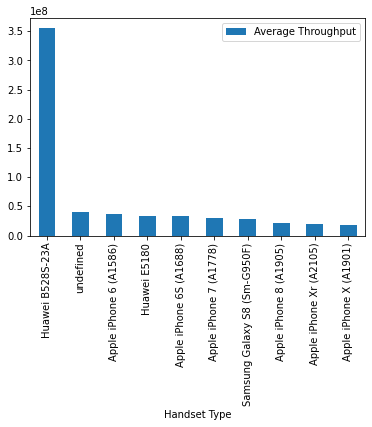

In [171]:
agg_handset.sort_values('Average Throughput', ascending=False)[:10].plot(
    kind='bar', x='Handset Type', y='Average Throughput', rot=90)


<AxesSubplot:xlabel='Handset Type'>

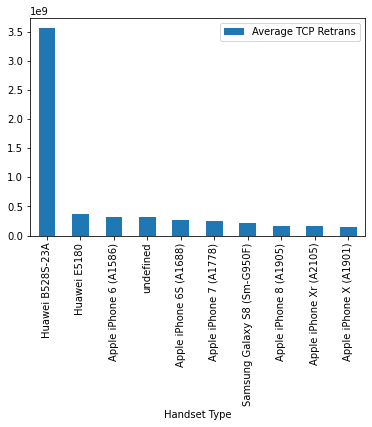

In [172]:
agg_handset.sort_values('Average TCP Retrans',ascending=False)[:10].plot(kind='bar',x='Handset Type',y='Average TCP Retrans',rot=90)

In [173]:
total_df = total_df.set_index('MSISDN/Number')
total_df


,TCP,Average RTT,Average Throughput
MSISDN/Number,,,
33601001722.0,2660.0,49.0,90.0
33601001754.0,2660.0,33.0,99.0
33601002511.0,2660.0,33.0,97.0
33601007832.0,2660.0,73.0,251.0
33601008617.0,211444.0,98.0,20888.0
...,...,...,...
33789996170.0,205195.0,52.0,10365.0
33789997247.0,2660.0,40.0,116.0
3197020876596.0,2660.0,33.0,90.0


In [174]:
normalized_df = (total_df - total_df.mean())/total_df.std()
normalized_df


,TCP,Average RTT,Average Throughput
MSISDN/Number,,,
33601001722.0,-0.544250,-0.380148,-0.607269
33601001754.0,-0.544250,-0.701055,-0.606683
33601002511.0,-0.544250,-0.701055,-0.606813
33601007832.0,-0.544250,0.101214,-0.596780
33601008617.0,0.836662,0.602632,0.747701
...,...,...,...
33789996170.0,0.795331,-0.319977,0.062138
33789997247.0,-0.544250,-0.560658,-0.605575
3197020876596.0,-0.544250,-0.701055,-0.607269


In [175]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_df)

centroids = Kmean.cluster_centers_
centroids


array([[ 0.73970947,  0.43610488,  0.70553169],
       [-0.50543161, -0.36292985, -0.4871337 ],
       [ 4.33786709,  4.28752463,  4.27210283]])

In [176]:
import plotly.express as px
fig = px.scatter_3d(normalized_df, x='TCP', y='Average RTT', z='Average Throughput',
                    color=Kmean.labels_.astype(float))

fig = px.scatter_3d(normalized_df, x='TCP', y='Average RTT', z='Average Throughput',
                    color=Kmean.labels_.astype(float))
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()


The most important strategy that I want to stick to for the coming weeks is not rushing ito writting code. I will first understand each task; identify what attributes to use, what is required. After I full understand I will start implementing my understanding. this way i will not run into difficult challenge after wasting a lot of energy on writing codes.